In [7]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import pandas as pd
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial.distance import pdist, squareform
import random
from collections import Counter
import time
from matplotlib import rc
rc('animation', html='jshtml')

In [8]:
class DialecticalEvolution:
    """
    Evolution model based on Hegelian dialectics and quantum-topological approach.
    Demonstrates the emergence of new qualities through the interaction of opposites.
    """

    def __init__(self, population_size=100, genome_length=20, mutation_rate=0.02,
                initial_dialectic_tension=0.5, dimensions=3):
        """
        Initializes the dialectical evolution model.

        Args:
            population_size: Size of the population
            genome_length: Length of each individual's genome
            mutation_rate: Probability of mutation during reproduction
            initial_dialectic_tension: Initial dialectical tension in the system
            dimensions: Number of dimensions for the evolutionary space
        """
        self.population_size = population_size
        self.genome_length = genome_length
        self.mutation_rate = mutation_rate
        self.dialectic_tension = initial_dialectic_tension
        self.dimensions = dimensions

        # Define alphabet with dialectically opposite pairs
        self.alphabet = ['A', 'a', 'B', 'b', 'C', 'c', 'D', 'd']
        self.opposites = {'A': 'a', 'a': 'A', 'B': 'b', 'b': 'B',
                         'C': 'c', 'c': 'C', 'D': 'd', 'd': 'D'}

        # Initialize population
        self.population = self._initialize_population()

        # Quality levels of evolution (5 levels of complexity)
        self.quality_levels = {
            0: "Primitive state",
            1: "Simple organization",
            2: "Differentiated system",
            3: "Integrated complexity",
            4: "Self-regulation",
            5: "Dialectical self-awareness"
        }

        # Track evolution history
        self.generation = 0
        self.evolution_history = {
            'generation': [0],
            'avg_fitness': [self._calculate_average_fitness()],
            'max_fitness': [self._calculate_max_fitness()],
            'dialectic_tension': [self.dialectic_tension],
            'quality_distribution': [self._get_quality_distribution()],
            'diversity': [self._calculate_diversity()],
            'emergent_properties': [0],
            'synthesis_events': [0]
        }

        # Track quality transitions
        self.quality_transitions = []
        self.synthesis_events_count = 0

        # Track positions in evolutionary space
        self.population_positions = self._calculate_positions()

        # Evolutionary space
        self.thesis_pole = np.array([1.0] * self.dimensions)  # Thesis pole
        self.antithesis_pole = -self.thesis_pole  # Antithesis pole

        # Synthesis center - central point where evolution tends to
        self.synthesis_center = np.zeros(self.dimensions)

        print(f"Dialectical evolution model initialized with {population_size} individuals")

    def _initialize_population(self):
        """
        Initializes the initial population with random genomes.

        Returns:
            List of individual genomes
        """
        population = []
        for _ in range(self.population_size):
            # Create a random genome from alphabet symbols
            genome = [random.choice(self.alphabet) for _ in range(self.genome_length)]
            population.append(genome)
        return population

    def _calculate_positions(self):
        """
        Calculates positions of individuals in evolutionary space based on their genomes.

        Returns:
            Numpy array with coordinates of each individual
        """
        positions = np.zeros((self.population_size, self.dimensions))

        for i, genome in enumerate(self.population):
            # Convert genome to coordinates in space
            # Uppercase letters pull towards thesis pole, lowercase - towards antithesis pole
            position = np.zeros(self.dimensions)

            for j, gene in enumerate(genome):
                # Distribute gene influence across different dimensions
                dim_index = j % self.dimensions

                # Determine direction of influence
                if gene.isupper():  # Thesis
                    position[dim_index] += 1 / self.genome_length * 2
                else:  # Antithesis
                    position[dim_index] -= 1 / self.genome_length * 2

            positions[i] = position

        return positions

    def _dialectic_reduction(self, genome):
        """
        Performs dialectical reduction of the genome, removing opposite pairs.
        This is analogous to homotopic reduction, but in the context of dialectics.

        Args:
            genome: Individual's genome

        Returns:
            Dialectically reduced genome
        """
        stack = []
        for gene in genome:
            if stack and gene == self.opposites.get(stack[-1], None):
                # Dialectical sublation of opposites
                stack.pop()
            else:
                stack.append(gene)
        return stack

    def _calculate_quality_level(self, genome):
        """
        Determines the qualitative development level of an individual based on its genome.

        Args:
            genome: Individual's genome

        Returns:
            Integer representing quality level (0-5)
        """
        # Reduced genome
        reduced = self._dialectic_reduction(genome)

        # Calculate gene diversity
        gene_diversity = len(set(genome)) / len(self.alphabet)

        # Thesis/antithesis ratio
        uppercase_count = sum(1 for gene in genome if gene.isupper())
        lowercase_count = len(genome) - uppercase_count

        # Ideal ratio - balance
        ratio_balance = 1 - abs(uppercase_count - lowercase_count) / len(genome)

        # Structural complexity - patterns of repetition and sequences
        patterns = self._detect_patterns(genome)

        # Symmetry in genome
        symmetry = self._calculate_symmetry(genome)

        # Stability after dialectical reduction
        stability = 1 - len(reduced) / len(genome)

        # Combined quality indicator
        quality_score = (gene_diversity * 0.2 +
                        ratio_balance * 0.2 +
                        patterns * 0.2 +
                        symmetry * 0.2 +
                        stability * 0.2)

        # Determine quality level (0-5)
        level = int(quality_score * 5)
        return min(5, level)

    def _detect_patterns(self, genome):
        """
        Detects patterns in the genome, reflecting structural complexity.

        Args:
            genome: Individual's genome

        Returns:
            Measure of pattern complexity (0-1)
        """
        # Simple metric based on n-grams
        # The more unique n-grams, the more complex the structure
        n = 3  # n-gram size
        if len(genome) < n:
            return 0

        # Get all n-grams
        ngrams = [tuple(genome[i:i+n]) for i in range(len(genome) - n + 1)]
        unique_ngrams = len(set(ngrams))

        # Normalization
        max_possible = min(len(genome) - n + 1, 4**n)  # Maximum number of possible n-grams
        if max_possible == 0:
            return 0

        return unique_ngrams / max_possible

    def _calculate_symmetry(self, genome):
        """
        Calculates symmetry in the genome.

        Args:
            genome: Individual's genome

        Returns:
            Measure of symmetry (0-1)
        """
        # Split genome in half and compare
        mid = len(genome) // 2
        first_half = genome[:mid]
        second_half = genome[mid:] if len(genome) % 2 == 0 else genome[mid+1:]

        # Reverse second half
        second_half_reversed = second_half[::-1]

        # Check how many pairs correspond to each other or are opposites
        matches = 0
        for i in range(min(len(first_half), len(second_half_reversed))):
            if (first_half[i] == second_half_reversed[i] or
                first_half[i] == self.opposites.get(second_half_reversed[i], None)):
                matches += 1

        # Normalize
        if min(len(first_half), len(second_half_reversed)) == 0:
            return 0

        return matches / min(len(first_half), len(second_half_reversed))

    def _calculate_fitness(self, genome):
        """
        Calculates the fitness of an individual, considering dialectical tension.

        Args:
            genome: Individual's genome

        Returns:
            Fitness value
        """
        # Determine quality level
        quality = self._calculate_quality_level(genome)

        # Calculate base fitness based on quality
        base_fitness = quality / 5.0

        # Reduced genome
        reduced = self._dialectic_reduction(genome)

        # Dialectical tension affects the importance of balance of opposites
        # With high tension, genomes with high synthesis potential are more valuable
        uppercase_count = sum(1 for gene in genome if gene.isupper())
        lowercase_count = len(genome) - uppercase_count

        # Dialectical balance - how close the ratio is to ideal
        dialectic_balance = 1 - abs(uppercase_count - lowercase_count) / len(genome)

        # Stability after reduction - reflects system integrity
        stability = 1 - len(reduced) / len(genome)

        # Combined fitness
        fitness = (base_fitness * 0.4 +
                  dialectic_balance * 0.3 * self.dialectic_tension +
                  stability * 0.3 * (1 - self.dialectic_tension))

        return fitness

    def _calculate_average_fitness(self):
        """
        Calculates the average fitness of the population.

        Returns:
            Average fitness
        """
        fitnesses = [self._calculate_fitness(genome) for genome in self.population]
        return sum(fitnesses) / len(fitnesses)

    def _calculate_max_fitness(self):
        """
        Finds the maximum fitness in the population.

        Returns:
            Maximum fitness
        """
        fitnesses = [self._calculate_fitness(genome) for genome in self.population]
        return max(fitnesses)

    def _calculate_diversity(self):
        """
        Calculates the genetic diversity of the population.

        Returns:
            Diversity value (0-1)
        """
        if self.population_size <= 1:
            return 0

        # Use Hamming distance between genomes
        distances = []
        for i in range(self.population_size):
            for j in range(i+1, self.population_size):
                dist = sum(1 for a, b in zip(self.population[i], self.population[j]) if a != b)
                distances.append(dist / self.genome_length)

        # Average normalized distance
        return sum(distances) / len(distances) if distances else 0

    def _get_quality_distribution(self):
        """
        Returns the distribution of quality levels in the population.

        Returns:
            Dictionary with the number of individuals at each quality level
        """
        quality_levels = [self._calculate_quality_level(genome) for genome in self.population]
        distribution = Counter(quality_levels)

        # Ensure all levels are present in the dictionary
        return {level: distribution.get(level, 0) for level in range(6)}

    def _detect_synthesis_event(self, parent1, parent2, offspring):
        """
        Detects a dialectical synthesis event - the emergence of a new
        quality when crossing two opposites.

        Args:
            parent1, parent2: Parent genomes
            offspring: Offspring genome

        Returns:
            True if synthesis occurred, False otherwise
        """
        # Quality levels of parents and offspring
        quality1 = self._calculate_quality_level(parent1)
        quality2 = self._calculate_quality_level(parent2)
        quality_offspring = self._calculate_quality_level(offspring)

        # Synthesis occurs when offspring exceeds both parents
        if quality_offspring > max(quality1, quality2):
            # Additionally check dialectical opposition of parents
            parent1_upper = sum(1 for gene in parent1 if gene.isupper())
            parent1_lower = len(parent1) - parent1_upper

            parent2_upper = sum(1 for gene in parent2 if gene.isupper())
            parent2_lower = len(parent2) - parent2_upper

            # Parents should be opposites in some sense
            if (parent1_upper > parent1_lower and parent2_upper < parent2_lower) or \
               (parent1_upper < parent1_lower and parent2_upper > parent2_lower):
                return True

        return False

    def _select_parents(self):
        """
        Selects parents for reproduction based on their fitness.

        Returns:
            Indices of two selected parents
        """
        # Calculate fitness of all individuals
        fitnesses = [self._calculate_fitness(genome) for genome in self.population]

        # Use roulette selection with probability proportional to fitness
        total_fitness = sum(fitnesses)

        if total_fitness == 0:  # Avoid division by zero
            return random.sample(range(self.population_size), 2)

        # Select first parent
        pick = random.uniform(0, total_fitness)
        current = 0
        parent1_idx = 0
        for i, fitness in enumerate(fitnesses):
            current += fitness
            if current > pick:
                parent1_idx = i
                break

        # Select second parent, excluding the first
        remaining_fitness = total_fitness - fitnesses[parent1_idx]
        if remaining_fitness == 0:  # If remaining fitnesses are zero
            potential_parents = [i for i in range(self.population_size) if i != parent1_idx]
            return parent1_idx, random.choice(potential_parents)

        pick = random.uniform(0, remaining_fitness)
        current = 0
        parent2_idx = 0
        for i, fitness in enumerate(fitnesses):
            if i == parent1_idx:
                continue
            current += fitness
            if current > pick:
                parent2_idx = i
                break

        return parent1_idx, parent2_idx

    def _crossover(self, parent1, parent2):
        """
        Performs crossover of two parents using a dialectical approach.

        Args:
            parent1, parent2: Parent genomes

        Returns:
            Offspring genome
        """
        # Choose random crossover point
        crossover_point = random.randint(1, self.genome_length - 1)

        # Create offspring by combining parts of parent genomes
        offspring = parent1[:crossover_point] + parent2[crossover_point:]

        # Apply dialectical logic to the crossover process
        # 1. Find contradictions at the junction
        if crossover_point < self.genome_length:
            left_gene = parent1[crossover_point-1]
            right_gene = parent2[crossover_point]

            # 2. If genes are dialectically opposite, synthesis is possible
            if right_gene == self.opposites.get(left_gene, None):
                # Synthesis creates new quality - add new gene at junction
                synthesis_options = [g for g in self.alphabet
                                  if g != left_gene and g != right_gene]
                if synthesis_options:
                    synthesis_gene = random.choice(synthesis_options)
                    offspring = offspring[:crossover_point] + [synthesis_gene] + offspring[crossover_point:]

        return offspring

    def _mutate(self, genome):
        """
        Applies mutations to the genome with a given probability.

        Args:
            genome: Original genome

        Returns:
            Mutated genome
        """
        mutated = genome.copy()

        for i in range(len(mutated)):
            if random.random() < self.mutation_rate:
                # 50% chance to change to opposite
                if random.random() < 0.5:
                    mutated[i] = self.opposites.get(mutated[i], mutated[i])
                else:
                    # Otherwise random gene
                    mutated[i] = random.choice(self.alphabet)

        return mutated

    def evolve(self, generations=100):
        """
        Runs the evolution process for a given number of generations.

        Args:
            generations: Number of generations for evolution
        """
        for gen in range(generations):
            self.generation += 1

            # Create a new population
            new_population = []
            emergent_properties = 0
            synthesis_events = 0

            for _ in range(self.population_size):
                # Select parents
                parent1_idx, parent2_idx = self._select_parents()
                parent1 = self.population[parent1_idx]
                parent2 = self.population[parent2_idx]

                # Crossover
                offspring = self._crossover(parent1, parent2)

                # Check for new quality synthesis
                if self._detect_synthesis_event(parent1, parent2, offspring):
                    synthesis_events += 1

                    # Save information about the qualitative transition
                    parent1_quality = self._calculate_quality_level(parent1)
                    parent2_quality = self._calculate_quality_level(parent2)
                    offspring_quality = self._calculate_quality_level(offspring)

                    self.quality_transitions.append({
                        'generation': self.generation,
                        'parent1_quality': parent1_quality,
                        'parent2_quality': parent2_quality,
                        'offspring_quality': offspring_quality,
                        'parent1': parent1,
                        'parent2': parent2,
                        'offspring': offspring
                    })

                    # If offspring reaches a new quality level
                    if offspring_quality > max(parent1_quality, parent2_quality):
                        emergent_properties += 1

                # Mutation
                offspring = self._mutate(offspring)

                # Add offspring to new population
                new_population.append(offspring)

            # Update population
            self.population = new_population

            # Update positions in evolutionary space
            self.population_positions = self._calculate_positions()

            # Update dialectical tension
            # Tension fluctuates depending on diversity and success of synthesis
            diversity = self._calculate_diversity()
            self.dialectic_tension = (self.dialectic_tension * 0.8 +
                                    0.2 * (1 - emergent_properties / self.population_size))

            # Limit tension value
            self.dialectic_tension = max(0.1, min(0.9, self.dialectic_tension))

            # Record evolution history
            self.evolution_history['generation'].append(self.generation)
            self.evolution_history['avg_fitness'].append(self._calculate_average_fitness())
            self.evolution_history['max_fitness'].append(self._calculate_max_fitness())
            self.evolution_history['dialectic_tension'].append(self.dialectic_tension)
            self.evolution_history['quality_distribution'].append(self._get_quality_distribution())
            self.evolution_history['diversity'].append(diversity)
            self.evolution_history['emergent_properties'].append(emergent_properties)
            self.evolution_history['synthesis_events'].append(synthesis_events)

            self.synthesis_events_count += synthesis_events

            # Output progress
            if (gen + 1) % 10 == 0 or gen == generations - 1:
                avg_fitness = self.evolution_history['avg_fitness'][-1]
                max_fitness = self.evolution_history['max_fitness'][-1]
                quality_dist = self.evolution_history['quality_distribution'][-1]
                highest_quality = max([level for level, count in quality_dist.items() if count > 0])

                print(f"Generation {self.generation}: Avg. Fitness={avg_fitness:.4f}, "
                    f"Max. Fitness={max_fitness:.4f}, "
                    f"Highest Quality Level={highest_quality} "
                    f"({self.quality_levels[highest_quality]})")

    def visualize_evolution(self):
        """
        Visualizes the evolution process.
        """
        plt.figure(figsize=(15, 10))

        # Fitness Graph
        plt.subplot(2, 2, 1)
        plt.plot(self.evolution_history['generation'],
                self.evolution_history['avg_fitness'],
                label='Average Fitness')
        plt.plot(self.evolution_history['generation'],
                self.evolution_history['max_fitness'],
                label='Maximum Fitness')
        plt.xlabel('Generation')
        plt.ylabel('Fitness')
        plt.title('Fitness Dynamics')
        plt.legend()
        plt.grid(True)

        # Dialectic Tension Graph
        plt.subplot(2, 2, 2)
        plt.plot(self.evolution_history['generation'],
                self.evolution_history['dialectic_tension'])
        plt.xlabel('Generation')
        plt.ylabel('Dialectic Tension')
        plt.title('Dialectic Tension Dynamics')
        plt.grid(True)

        # Diversity Graph
        plt.subplot(2, 2, 3)
        plt.plot(self.evolution_history['generation'],
                self.evolution_history['diversity'])
        plt.xlabel('Generation')
        plt.ylabel('Genetic Diversity')
        plt.title('Genetic Diversity Dynamics')
        plt.grid(True)

        # Synthesis and Emergent Properties Graph
        plt.subplot(2, 2, 4)
        plt.plot(self.evolution_history['generation'],
                self.evolution_history['synthesis_events'],
                label='Synthesis Events')
        plt.plot(self.evolution_history['generation'],
                self.evolution_history['emergent_properties'],
                label='Emergent Properties')
        plt.xlabel('Generation')
        plt.ylabel('Quantity')
        plt.title('Dialectical Synthesis and Emergence')
        plt.legend()
        plt.grid(True)

        plt.tight_layout()
        plt.show()

    def visualize_quality_distribution(self):
        """
        Visualizes the distribution of quality levels during evolution.
        """
        # Create DataFrame for analysis
        data = []

        for gen, dist in zip(self.evolution_history['generation'],
                        self.evolution_history['quality_distribution']):
            for level, count in dist.items():
                data.append({
                    'Generation': gen,
                    'Quality Level': level,
                    'Level Name': self.quality_levels[level],
                    'Count': count
                })

        df = pd.DataFrame(data)

        # Create heatmap
        pivoted = df.pivot(index='Generation', columns='Level Name', values='Count')

        plt.figure(figsize=(15, 8))
        sns.heatmap(pivoted, cmap='viridis', annot=False, cbar_kws={'label': 'Number of Individuals'})
        plt.title('Distribution of Quality Levels in the Evolution Process')
        plt.ylabel('Generation')
        plt.xlabel('Quality Level')

        plt.tight_layout()
        plt.show()

        # Create graph showing change in proportion of each level over time
        plt.figure(figsize=(15, 8))

        for level in range(6):
            level_data = df[df['Quality Level'] == level]
            if not level_data.empty:
                plt.plot(level_data['Generation'],
                        level_data['Count'] / self.population_size,
                        label=f"{level}: {self.quality_levels[level]}")

        plt.xlabel('Generation')
        plt.ylabel('Population Share')
        plt.title('Change in the Distribution of Quality Levels')
        plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12), ncol=3)
        plt.grid(True)

        plt.tight_layout()
        plt.show()

    def visualize_evolutionary_space(self):
        """
        Visualizes the evolutionary space with thesis, antithesis, and synthesis.
        """
        # For visualization, use only the first 3 dimensions if there are more
        vis_dims = min(3, self.dimensions)

        if vis_dims == 3:
            fig = plt.figure(figsize=(12, 10))
            ax = fig.add_subplot(111, projection='3d')

            # Display current positions of individuals
            qualities = [self._calculate_quality_level(genome) for genome in self.population]
            colors = plt.cm.viridis(np.array(qualities) / 5)

            ax.scatter(self.population_positions[:, 0],
                    self.population_positions[:, 1],
                    self.population_positions[:, 2],
                    c=colors, s=50, alpha=0.7)

            # Display the thesis and antithesis poles
            ax.scatter([self.thesis_pole[0]], [self.thesis_pole[1]], [self.thesis_pole[2]],
                    color='red', s=200, marker='^', label='Thesis')
            ax.scatter([self.antithesis_pole[0]], [self.antithesis_pole[1]], [self.antithesis_pole[2]],
                    color='blue', s=200, marker='v', label='Antithesis')

            # Display the synthesis center
            ax.scatter([self.synthesis_center[0]], [self.synthesis_center[1]], [self.synthesis_center[2]],
                    color='green', s=200, marker='*', label='Synthesis Center')

            # Configure the graph
            ax.set_xlabel('Dimension 1')
            ax.set_ylabel('Dimension 2')
            ax.set_zlabel('Dimension 3')
            ax.set_title('Evolutionary Space of Dialectical Evolution')

            # Add color scale for quality levels
            sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(0, 5))
            cbar = plt.colorbar(sm, ax=ax)
            cbar.set_label('Quality Level')
            cbar.set_ticks(range(6))
            cbar.set_ticklabels([f"{i}: {self.quality_levels[i]}" for i in range(6)])

            ax.legend()

        elif vis_dims == 2:
            plt.figure(figsize=(12, 10))

            # Display current positions of individuals
            qualities = [self._calculate_quality_level(genome) for genome in self.population]
            colors = plt.cm.viridis(np.array(qualities) / 5)

            plt.scatter(self.population_positions[:, 0],
                    self.population_positions[:, 1],
                    c=colors, s=50, alpha=0.7)

            # Display the thesis and antithesis poles
            plt.scatter([self.thesis_pole[0]], [self.thesis_pole[1]],
                    color='red', s=200, marker='^', label='Thesis')
            plt.scatter([self.antithesis_pole[0]], [self.antithesis_pole[1]],
                    color='blue', s=200, marker='v', label='Antithesis')

            # Display the synthesis center
            plt.scatter([self.synthesis_center[0]], [self.synthesis_center[1]],
                    color='green', s=200, marker='*', label='Synthesis Center')

            # Configure the graph
            plt.xlabel('Dimension 1')
            plt.ylabel('Dimension 2')
            plt.title('Evolutionary Space of Dialectical Evolution')

            # Add color scale for quality levels
            sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(0, 5))
            cbar = plt.colorbar(sm, ax=ax)
            cbar.set_label('Quality Level')
            cbar.set_ticks(range(6))
            cbar.set_ticklabels([f"{i}: {self.quality_levels[i]}" for i in range(6)])

            plt.legend()
            plt.grid(True)

        plt.tight_layout()
        plt.show()

    def visualize_synthesis_events(self):
        """
        Visualizes dialectical synthesis events.
        """
        if not self.quality_transitions:
            print("No synthesis events found for visualization.")
            return

        # Analyze quality transitions
        transitions_df = pd.DataFrame(self.quality_transitions)

        # Create graph of quality transitions
        plt.figure(figsize=(15, 8))

        # For each transition, draw an arrow from parents to offspring
        for _, row in transitions_df.iterrows():
            # Coordinates for parents and offspring (generation, quality level)
            parent1_x, parent1_y = row['generation'] - 0.2, row['parent1_quality']
            parent2_x, parent2_y = row['generation'] - 0.2, row['parent2_quality']
            offspring_x, offspring_y = row['generation'], row['offspring_quality']

            # Draw arrows from parents to offspring
            plt.arrow(parent1_x, parent1_y, offspring_x - parent1_x, offspring_y - parent1_y,
                    head_width=0.1, head_length=0.1, fc='blue', ec='blue', alpha=0.3)
            plt.arrow(parent2_x, parent2_y, offspring_x - parent2_x, offspring_y - parent2_y,
                    head_width=0.1, head_length=0.1, fc='green', ec='green', alpha=0.3)

            # Mark parent and offspring points
            plt.scatter([parent1_x, parent2_x], [parent1_y, parent2_y],
                    color=['blue', 'green'], s=30)
            plt.scatter(offspring_x, offspring_y, color='red', s=50)

        # Configure the graph
        plt.xlabel('Generation')
        plt.ylabel('Quality Level')
        plt.title('Dialectical Synthesis Events: Transitions to New Quality')
        plt.yticks(range(6), [f"{i}: {self.quality_levels[i]}" for i in range(6)])
        plt.grid(True)

        plt.tight_layout()
        plt.show()

        # Analyze frequency and significance of syntheses by generation
        plt.figure(figsize=(15, 6))

        # Group transitions by generation
        synthesis_by_gen = transitions_df.groupby('generation').size()
        generations = range(1, self.generation + 1)
        counts = [synthesis_by_gen.get(gen, 0) for gen in generations]

        plt.bar(generations, counts, alpha=0.7)
        plt.xlabel('Generation')
        plt.ylabel('Number of Synthesis Events')
        plt.title('Frequency of Dialectical Synthesis Events by Generation')
        plt.grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

    def visualize_dialectic_process(self):
        """
        Creates an animation of the dialectical evolution process.
        """
        # For animation, use only the first 2 dimensions
        vis_dims = min(2, self.dimensions)

        # Create a new object for animation
        animation_model = DialecticalEvolution(
            population_size=50,  # Fewer individuals for clarity
            genome_length=self.genome_length,
            mutation_rate=self.mutation_rate,
            initial_dialectic_tension=0.5,
            dimensions=vis_dims
        )

        # Create figure for animation
        fig, ax = plt.subplots(figsize=(10, 8))

        # Plot poles
        thesis, = ax.plot([animation_model.thesis_pole[0]], [animation_model.thesis_pole[1]],
                        'r^', markersize=15, label='Thesis')
        antithesis, = ax.plot([animation_model.antithesis_pole[0]], [animation_model.antithesis_pole[1]],
                            'bv', markersize=15, label='Antithesis')
        synthesis, = ax.plot([animation_model.synthesis_center[0]], [animation_model.synthesis_center[1]],
                            'g*', markersize=15, label='Synthesis Center')

        # Initialize population points
        population_scatter = ax.scatter(
            animation_model.population_positions[:, 0],
            animation_model.population_positions[:, 1],
            c=np.zeros(animation_model.population_size),
            cmap='viridis',
            s=50,
            alpha=0.7
        )

        # Title and legend
        title = ax.set_title('Generation 0')
        ax.set_xlabel('Dimension 1')
        ax.set_ylabel('Dimension 2')
        ax.legend(loc='upper right')
        ax.grid(True)

        # Set axis limits
        ax.set_xlim(-1.5, 1.5)
        ax.set_ylim(-1.5, 1.5)

        # Add color scale
        sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(0, 5))
        cbar = plt.colorbar(sm, ax=ax)
        cbar.set_label('Quality Level')
        cbar.set_ticks(range(6))
        cbar.set_ticklabels([f"{i}: {animation_model.quality_levels[i]}" for i in range(6)])

        def init():
            """Animation initialization."""
            qualities = [animation_model._calculate_quality_level(genome)
                    for genome in animation_model.population]

            population_scatter.set_offsets(animation_model.population_positions[:, :2])
            population_scatter.set_array(np.array(qualities))
            title.set_text(f'Generation 0')

            return population_scatter, title

        def update(frame):
            """Animation update."""
            # One step of evolution
            animation_model.evolve(generations=1)

            # Update population display
            qualities = [animation_model._calculate_quality_level(genome)
                    for genome in animation_model.population]

            population_scatter.set_offsets(animation_model.population_positions[:, :2])
            population_scatter.set_array(np.array(qualities))

            # Update title
            max_quality = max(qualities)
            title.set_text(f'Generation {animation_model.generation}: '
                        f'Maximum Quality Level = {max_quality} '
                        f'({animation_model.quality_levels[max_quality]})')

            return population_scatter, title

        # Create animation
        ani = FuncAnimation(fig, update, frames=100,
                        init_func=init, blit=False, interval=200)
        plt.tight_layout()

        return ani

    def analyze_dialectical_opposites(self):
        """
        Analyzes the role of dialectical opposites in evolution.
        """
        # Collect data on the ratio of opposites in genomes
        ratios = []
        qualities = []

        for genome in self.population:
            uppercase_count = sum(1 for gene in genome if gene.isupper())
            lowercase_count = len(genome) - uppercase_count

            # Thesis/antithesis ratio (0.5 means equal ratio)
            ratio = uppercase_count / len(genome)

            # Quality level
            quality = self._calculate_quality_level(genome)

            ratios.append(ratio)
            qualities.append(quality)

        # Create graph of quality dependency on the ratio of opposites
        plt.figure(figsize=(12, 8))

        plt.scatter(ratios, qualities, c=qualities, cmap='viridis', s=100, alpha=0.7)

        plt.axvline(x=0.5, color='red', linestyle='--', alpha=0.5,
                label='Ideal Balance of Opposites')

        # Add regression curve
        try:
            from scipy.stats import gaussian_kde

            # Kernel density estimation to visualize the trend
            xy = np.vstack([ratios, qualities])
            z = gaussian_kde(xy)(xy)

            # Sort points by density
            idx = z.argsort()
            x, y, z = np.array(ratios)[idx], np.array(qualities)[idx], z[idx]

            plt.scatter(x, y, c=z, s=100, alpha=0.7, edgecolor='')
        except:
            pass

        plt.xlabel('Thesis/Antithesis Ratio (Share of Thesis Genes)')
        plt.ylabel('Quality Level')
        plt.title('Dependency of Quality Level on the Balance of Opposites')
        plt.colorbar(label='Quality Level')
        plt.grid(True)
        plt.legend()

        plt.tight_layout()
        plt.show()

        # Analyze the distribution of thesis/antithesis ratios
        plt.figure(figsize=(12, 6))

        plt.hist(ratios, bins=20, alpha=0.7, color='purple')
        plt.axvline(x=0.5, color='red', linestyle='--', alpha=0.7,
                label='Ideal Balance')

        plt.xlabel('Thesis/Antithesis Ratio')
        plt.ylabel('Number of Individuals')
        plt.title('Distribution of the Balance of Opposites in the Population')
        plt.grid(True)
        plt.legend()

        plt.tight_layout()
        plt.show()

def run_dialectical_evolution_simulation():
    """
    Runs a demonstration of the dialectical evolution model.
    """
    print("=== Demonstration of the dialectical evolution model based on Hegelian philosophy ===\n")

    # Create the model
    model = DialecticalEvolution(population_size=200, genome_length=20,
                               mutation_rate=0.07, dimensions=3)

    print("Model initialized. Starting the evolution process...")

    # Run evolution
    start_time = time.time()
    model.evolve(generations=2000)
    end_time = time.time()

    print(f"\nEvolution completed in {end_time - start_time:.2f} seconds.")
    print(f"Total dialectical synthesis events: {model.synthesis_events_count}")

    # Visualize the results
    print("\nVisualizing the evolution results...")

    model.visualize_evolution()
    model.visualize_quality_distribution()
    model.visualize_evolutionary_space()
    model.visualize_synthesis_events()
    model.analyze_dialectical_opposites()

    print("\nDemonstrating the animation of the dialectical process...")
    ani = model.visualize_dialectic_process()

    return ani


=== Demonstration of the dialectical evolution model based on Hegelian philosophy ===

Dialectical evolution model initialized with 200 individuals
Model initialized. Starting the evolution process...
Generation 10: Avg. Fitness=0.4605, Max. Fitness=0.5280, Highest Quality Level=3 (Integrated complexity)
Generation 20: Avg. Fitness=0.4590, Max. Fitness=0.5225, Highest Quality Level=3 (Integrated complexity)
Generation 30: Avg. Fitness=0.4628, Max. Fitness=0.5209, Highest Quality Level=3 (Integrated complexity)
Generation 40: Avg. Fitness=0.4590, Max. Fitness=0.5200, Highest Quality Level=3 (Integrated complexity)
Generation 50: Avg. Fitness=0.4713, Max. Fitness=0.5275, Highest Quality Level=3 (Integrated complexity)
Generation 60: Avg. Fitness=0.4635, Max. Fitness=0.5240, Highest Quality Level=3 (Integrated complexity)
Generation 70: Avg. Fitness=0.4722, Max. Fitness=0.5194, Highest Quality Level=3 (Integrated complexity)
Generation 80: Avg. Fitness=0.4756, Max. Fitness=0.5206, Highest

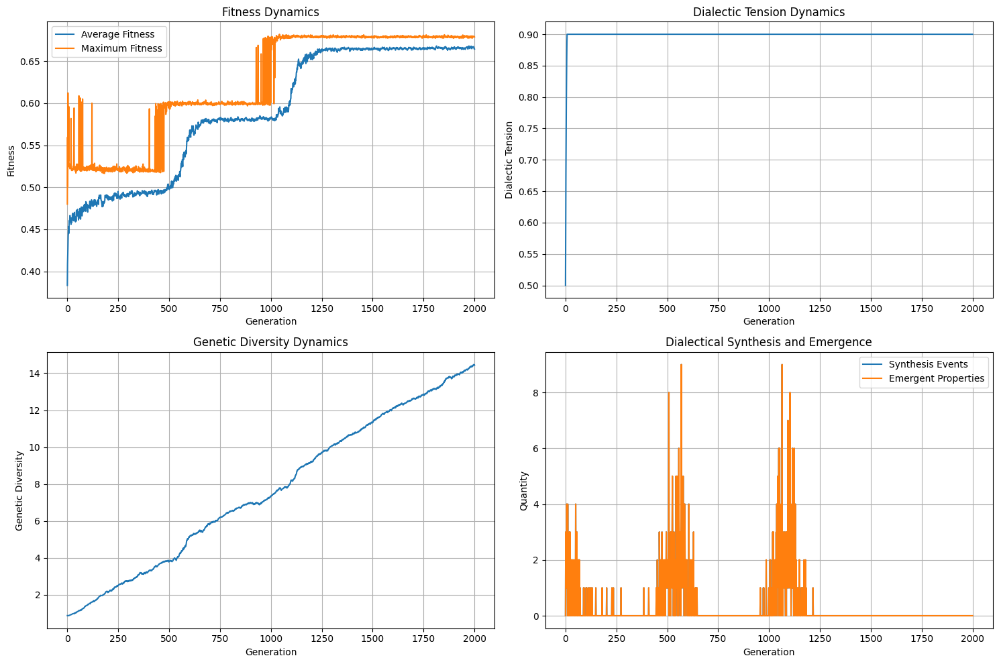

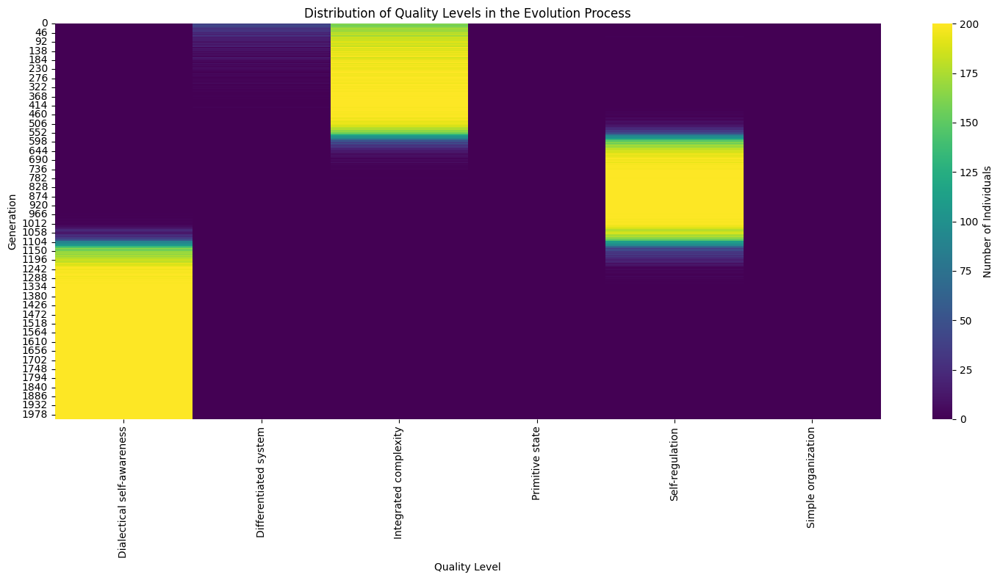

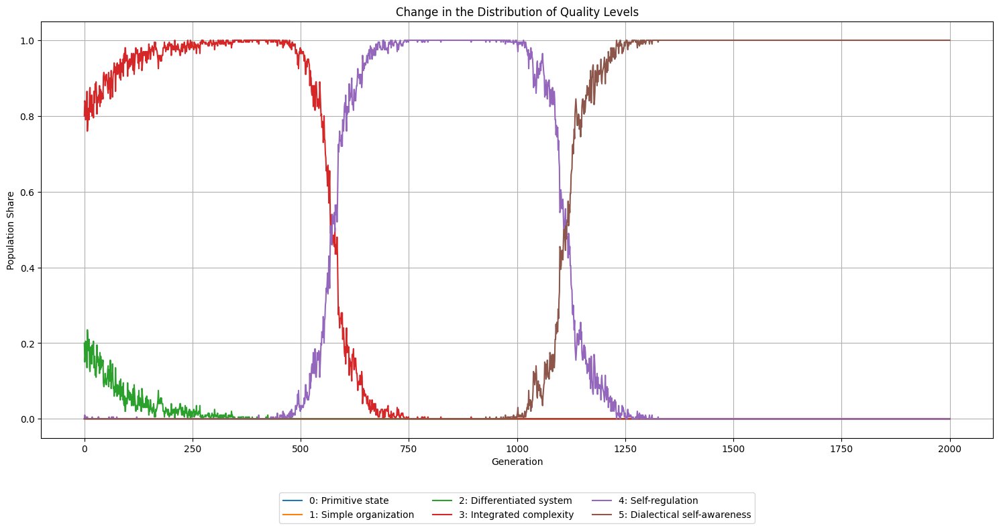

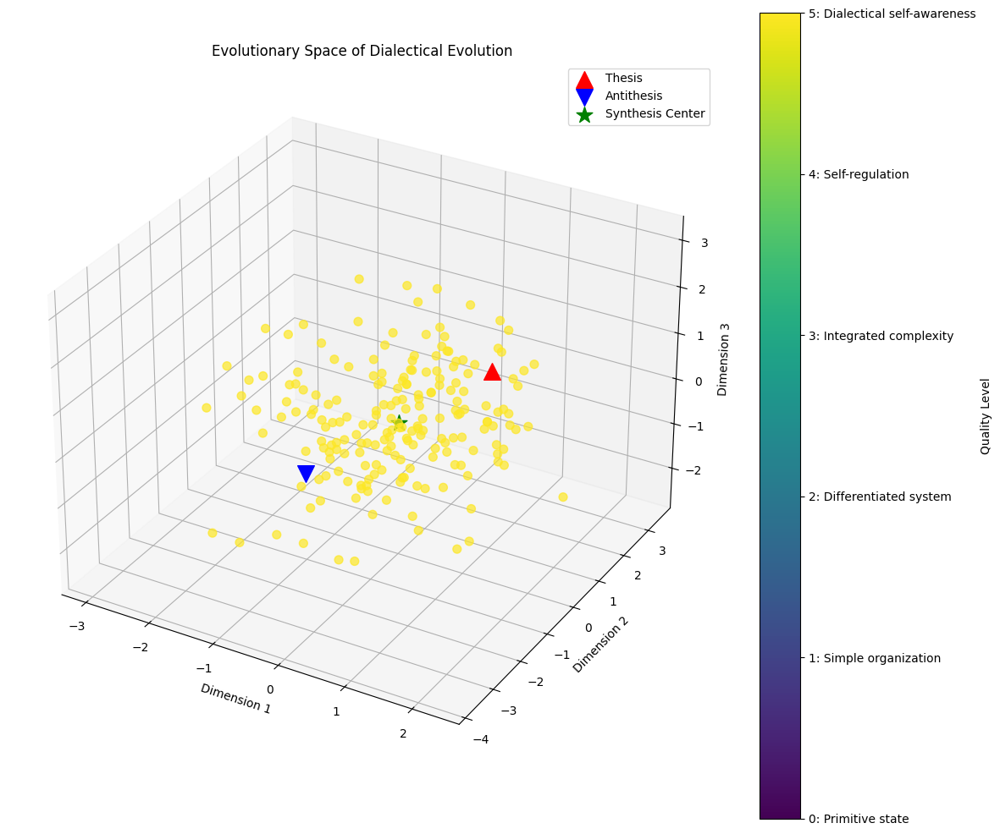

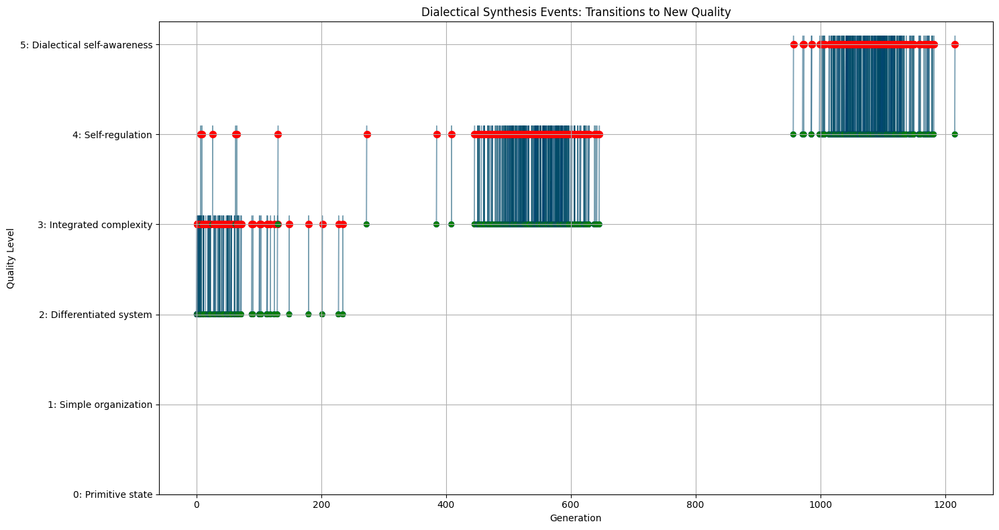

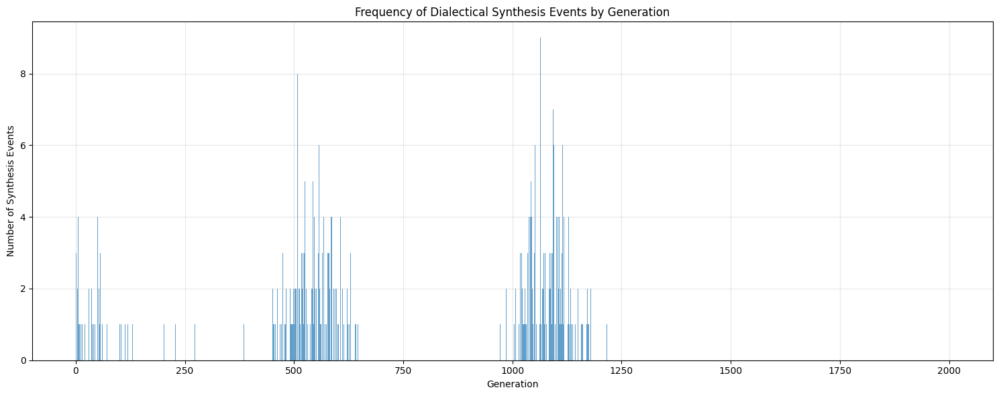

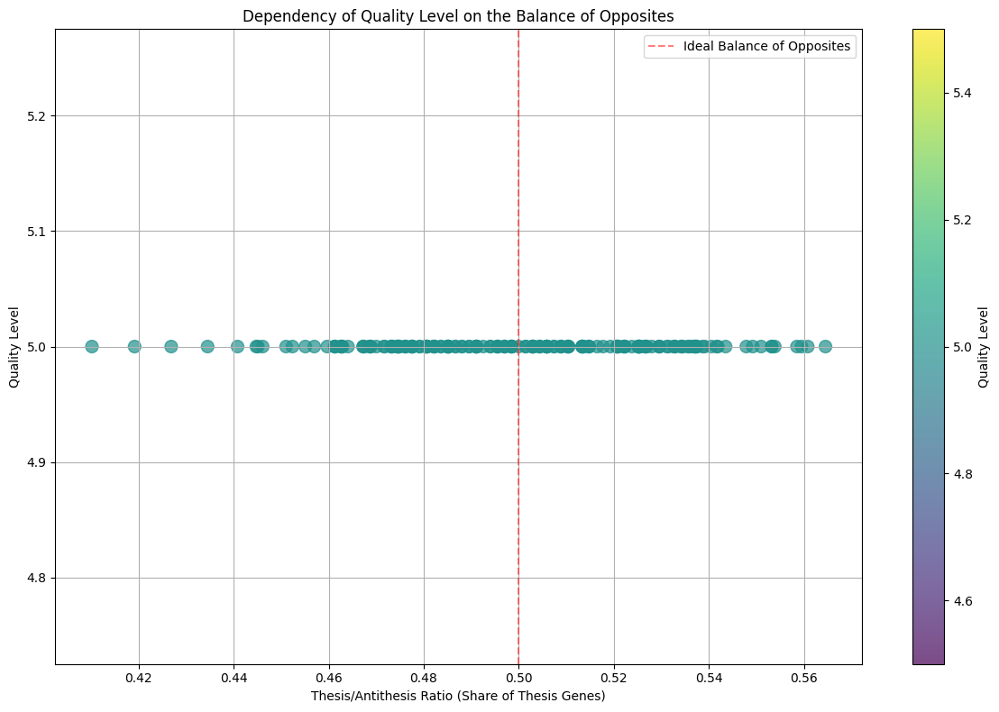

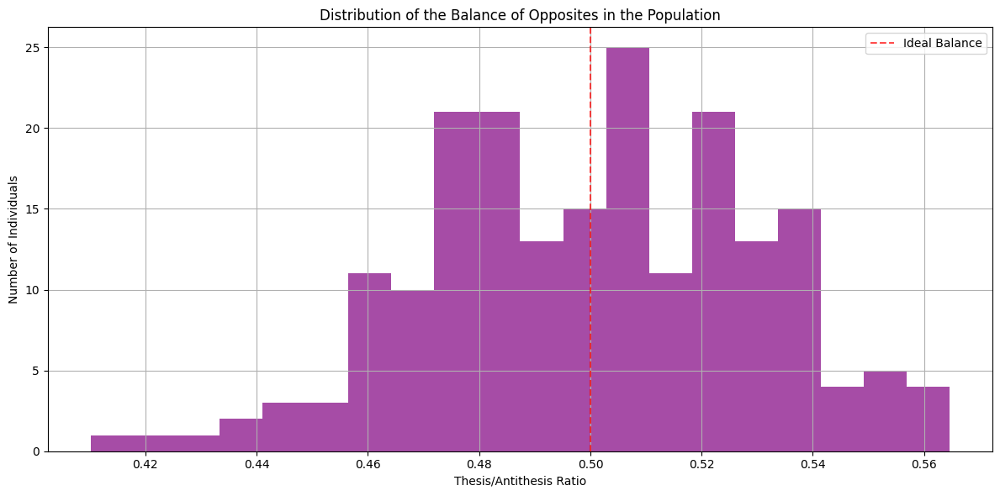


Demonstrating the animation of the dialectical process...
Dialectical evolution model initialized with 50 individuals
Generation 1: Avg. Fitness=0.4101, Max. Fitness=0.5040, Highest Quality Level=3 (Integrated complexity)
Generation 2: Avg. Fitness=0.4269, Max. Fitness=0.4920, Highest Quality Level=3 (Integrated complexity)
Generation 3: Avg. Fitness=0.4352, Max. Fitness=0.4939, Highest Quality Level=3 (Integrated complexity)
Generation 4: Avg. Fitness=0.4407, Max. Fitness=0.5093, Highest Quality Level=3 (Integrated complexity)
Generation 5: Avg. Fitness=0.4281, Max. Fitness=0.5098, Highest Quality Level=3 (Integrated complexity)
Generation 6: Avg. Fitness=0.4487, Max. Fitness=0.5136, Highest Quality Level=3 (Integrated complexity)
Generation 7: Avg. Fitness=0.4481, Max. Fitness=0.5159, Highest Quality Level=3 (Integrated complexity)
Generation 8: Avg. Fitness=0.4620, Max. Fitness=0.5190, Highest Quality Level=3 (Integrated complexity)
Generation 9: Avg. Fitness=0.4587, Max. Fitness=0

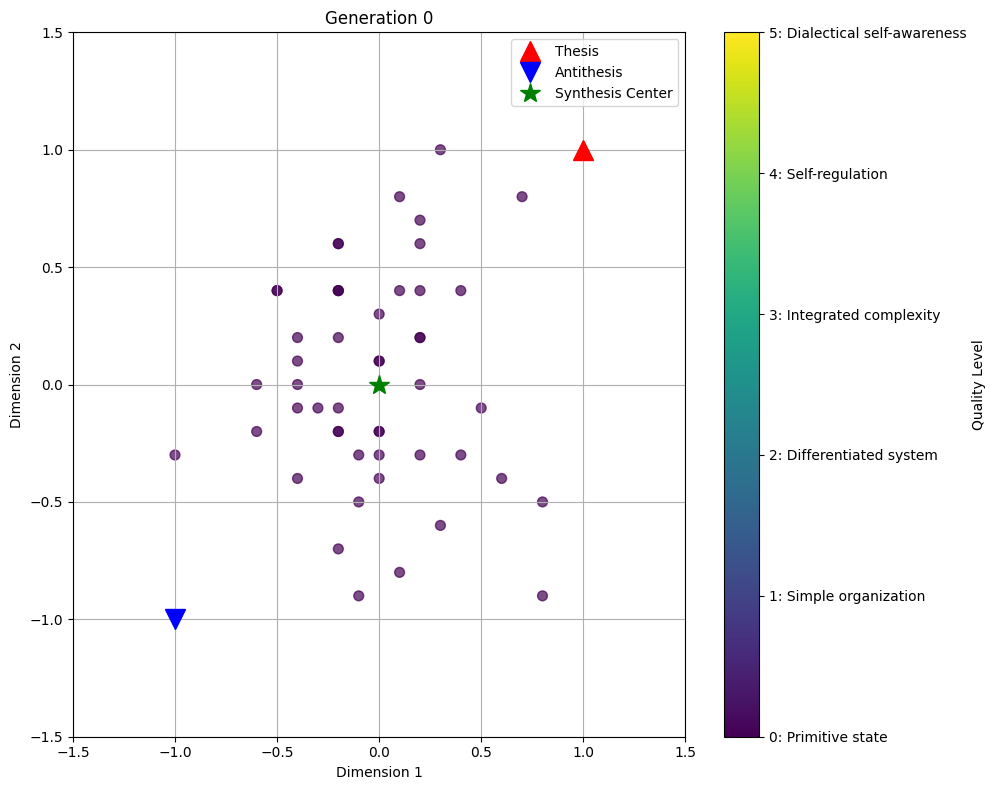

In [9]:
# Run simulation
animation = run_dialectical_evolution_simulation()
animation